In [1]:
# Importing necessary libraries for data processing,manipulation,clustering and PCA.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.metrics import silhouette_score
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
# IMporting the dataset
df = pd.read_csv('wine.csv')
df

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


# Viewing statistical distribution of data

In [3]:
df.describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Type             178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoids    178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Color            178 non-null    float64
 11  Hue              178 non-null    float64
 12  Dilution         178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [5]:
df.isnull().sum()

Type               0
Alcohol            0
Malic              0
Ash                0
Alcalinity         0
Magnesium          0
Phenols            0
Flavanoids         0
Nonflavanoids      0
Proanthocyanins    0
Color              0
Hue                0
Dilution           0
Proline            0
dtype: int64

In [6]:
df.duplicated().sum()

0

### Statistical summary - From the statistical observation the dataset following points are understood.
1. There are no missing values present in the dataset.
2. The mean and median as well as the 75% and extreme values do not have much variance so chances are that outliers maybe absent or very few present.This will be confirmed from graphical distribution.
3. All the datatypes are numerical.
4. No duplicated records are present.

# Viewing data ghraphically to understand patterns.

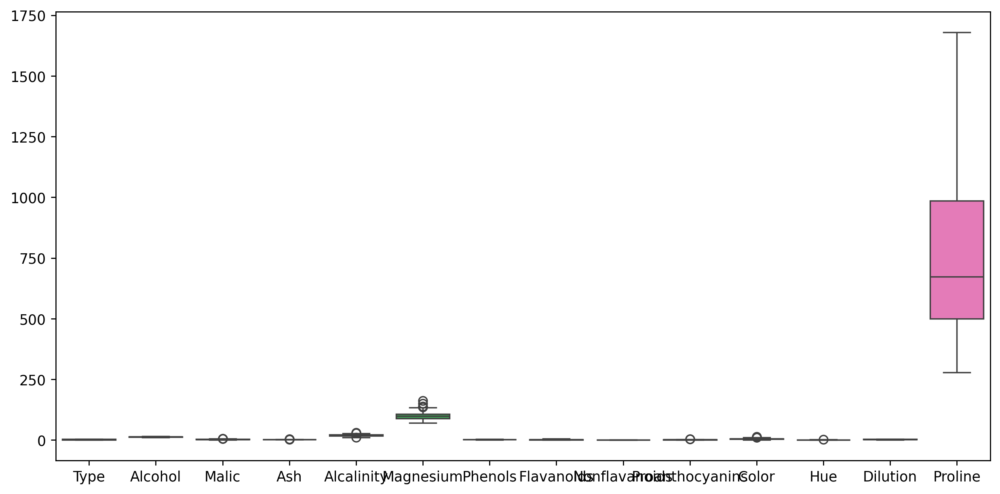

In [7]:
sns.boxplot(df)
plt.tight_layout()

### As outliers can be seen in the data, we will remove this outliers.

In [8]:
def outlier_detection(data, cols):
    
    for col in cols:
        q1 = data[col].quantile(0.25)
        q3 = data[col].quantile(0.75)
        iqr = q3-q1
    
        lower = q1-(1.5*iqr)
        upper = q3+(1.5*iqr)
        
        df[col] = np.where(df[col] > upper, upper, np.where(df[col] < lower, lower,df[col]))

In [9]:
outlier_detection(df, df.columns)

<Axes: >

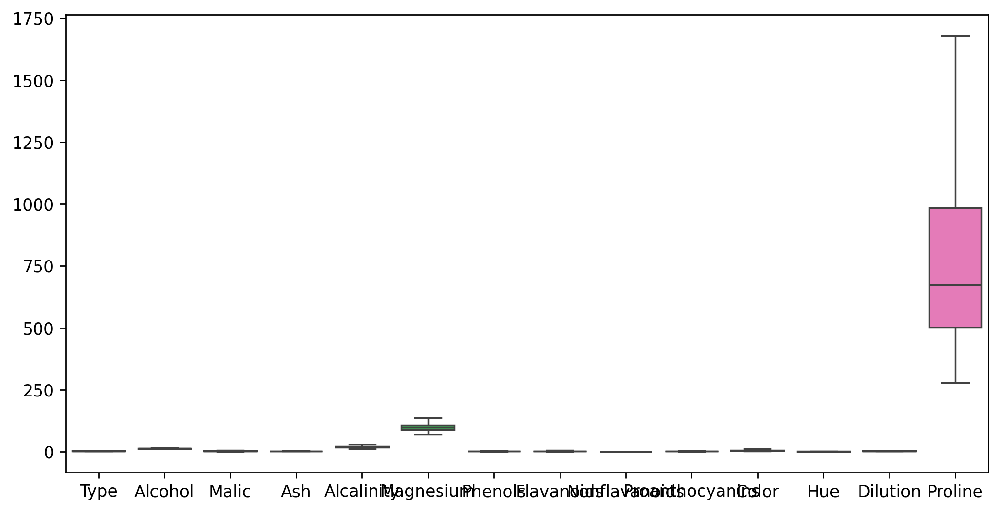

In [10]:
sns.boxplot(df)

### Now the data has been cleared from outliers.

In [11]:
df.corr()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
Type,1.000000,-0.328222,0.440422,-0.047680,0.525608,-0.224264,-0.719163,-0.847498,0.489109,-0.512528,0.260260,-0.621549,-0.788230,-0.633717
Alcohol,-0.328222,1.000000,0.094756,0.220174,-0.312191,0.302173,0.289101,0.236815,-0.155929,0.153171,0.549107,-0.067156,0.072343,0.643720
Malic,0.440422,0.094756,1.000000,0.166614,0.295882,-0.039329,-0.339050,-0.414875,0.294203,-0.234575,0.264897,-0.566409,-0.372582,-0.191173
Ash,-0.047680,0.220174,0.166614,1.000000,0.427713,0.322510,0.124436,0.097562,0.183666,0.006080,0.256799,-0.075904,-0.011214,0.229676
Alcalinity,0.525608,-0.312191,0.295882,0.427713,1.000000,-0.098030,-0.333046,-0.363405,0.369276,-0.208794,0.009748,-0.286664,-0.287032,-0.448700
Magnesium,-0.224264,0.302173,-0.039329,0.322510,-0.098030,1.000000,0.227035,0.209431,-0.255674,0.201428,0.240505,0.040007,0.064019,0.411557
Phenols,-0.719163,0.289101,-0.339050,0.124436,-0.333046,0.227035,1.000000,0.864564,-0.449935,0.618771,-0.062101,0.435952,0.699949,0.498115
Flavanoids,-0.847498,0.236815,-0.414875,0.097562,-0.363405,0.209431,0.864564,1.000000,-0.537900,0.665384,-0.169807,0.546718,0.787194,0.494193
Nonflavanoids,0.489109,-0.155929,0.294203,0.183666,0.369276,-0.255674,-0.449935,-0.537900,1.000000,-0.368455,0.131596,-0.266995,-0.503270,-0.311385
Proanthocyanins,-0.512528,0.153171,-0.234575,0.006080,-0.208794,0.201428,0.618771,0.665384,-0.368455,1.000000,-0.032693,0.306289,0.530565,0.340562


<Axes: >

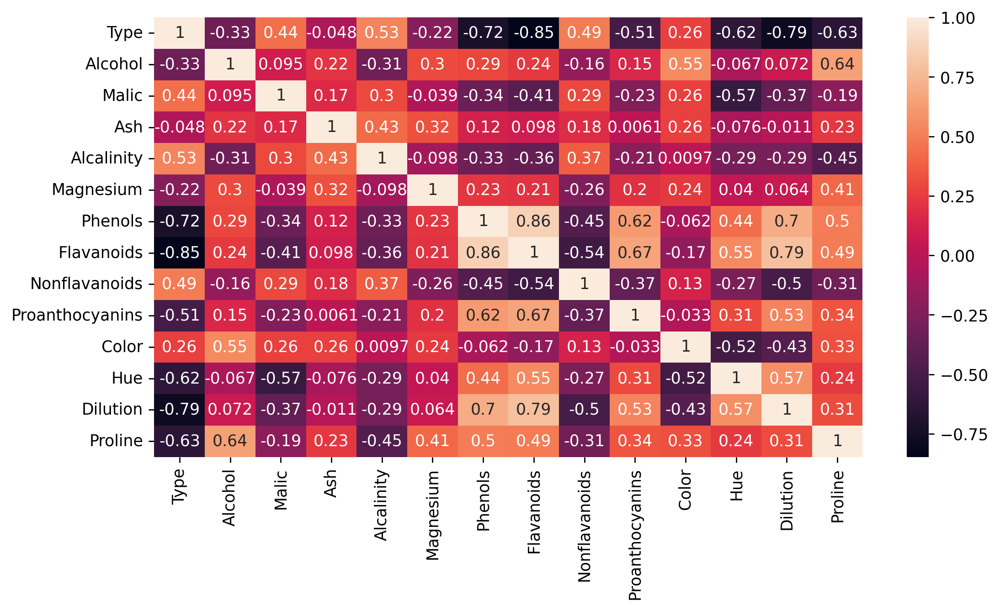

In [12]:
sns.heatmap(df.corr() , annot =True)

<Axes: xlabel='Type', ylabel='count'>

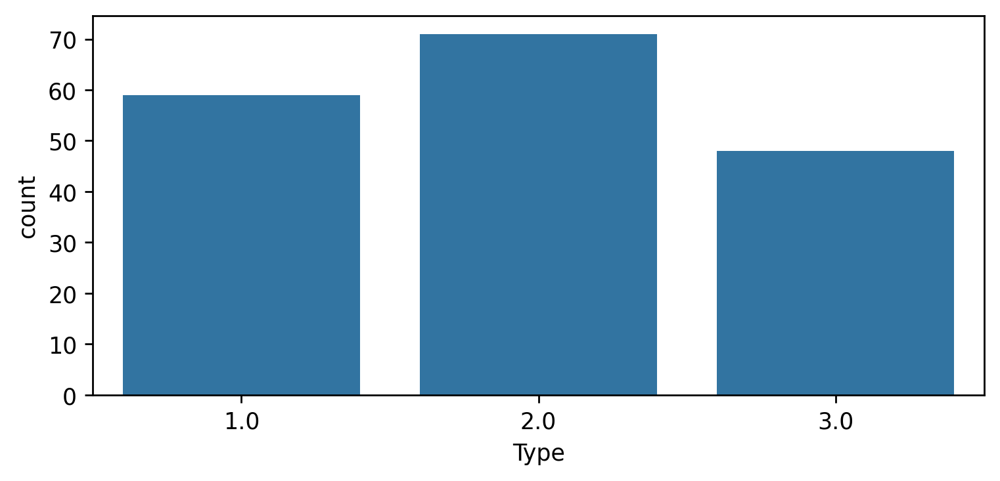

In [13]:
plt.figure(figsize=(7,3))
sns.countplot(x= df['Type'])

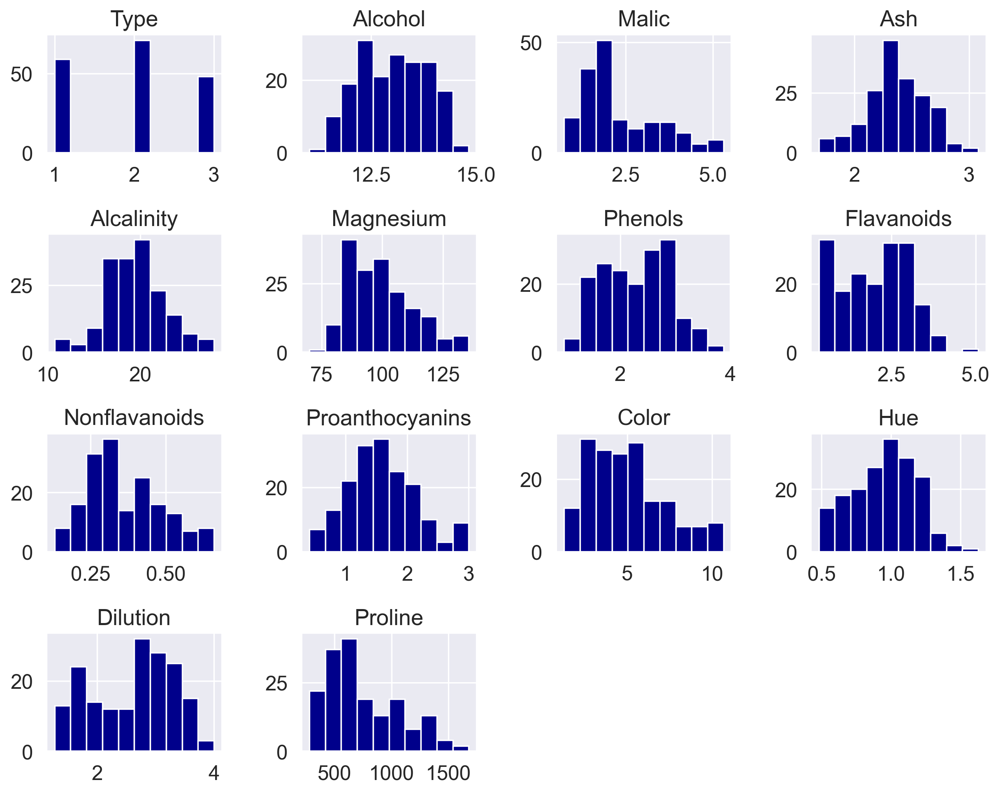

In [14]:
sns.set(style= 'dark', font_scale= 1.3)
df.hist(figsize=(10,8), bins=10,color= 'darkblue')
plt.tight_layout()

In [15]:
sns.pairplot(df)
plt.tight_layout()

### Now Standardizing and normalizing the data to check which gives better result

In [16]:
sc = StandardScaler()
std_data = sc.fit_transform(df)
std_data

array([[-1.21394365,  1.51861254, -0.56553422, ...,  0.36660959,
         1.84791957,  1.01300893],
       [-1.21394365,  0.24628963, -0.50172839, ...,  0.41076822,
         1.1134493 ,  0.96524152],
       [-1.21394365,  0.19687903,  0.02694849, ...,  0.32245097,
         0.78858745,  1.39514818],
       ...,
       [ 1.37386437,  0.33275817,  1.77705125, ..., -1.6205284 ,
        -1.48544548,  0.28057537],
       [ 1.37386437,  0.20923168,  0.23659622, ..., -1.57636978,
        -1.40069891,  0.29649784],
       [ 1.37386437,  1.39508604,  1.61297912, ..., -1.53221115,
        -1.42894777, -0.59516041]])

In [17]:
ms = MinMaxScaler()
norm_data = ms.fit_transform(df)
norm_data

array([[0.        , 0.84210526, 0.21260274, ..., 0.48854962, 0.97069597,
        0.56134094],
       [0.        , 0.57105263, 0.22794521, ..., 0.49727372, 0.78021978,
        0.55064194],
       [0.        , 0.56052632, 0.35506849, ..., 0.47982552, 0.6959707 ,
        0.64693295],
       ...,
       [1.        , 0.58947368, 0.77589041, ..., 0.0959651 , 0.10622711,
        0.39728959],
       [1.        , 0.56315789, 0.40547945, ..., 0.1046892 , 0.12820513,
        0.40085592],
       [1.        , 0.81578947, 0.73643836, ..., 0.1134133 , 0.12087912,
        0.20114123]])

In [18]:
cluster_range = range(1,15)
cluster_errors = []
for cluster in cluster_range:
    clusters = KMeans(cluster,n_init=10)
    clusters.fit(std_data)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_errors.append(clusters.inertia_)
clusters_df = pd.DataFrame({"Num_Clusters":cluster_range,"Cluster_Errors":cluster_errors})
clusters_df

,Num_Clusters,Cluster_Errors
0,1,2492.000000
1,2,1723.126775
2,3,1273.290195
3,4,1173.826936
4,5,1109.825119
5,6,1058.134469
6,7,991.538513
7,8,952.891337
8,9,906.133744
9,10,873.284357


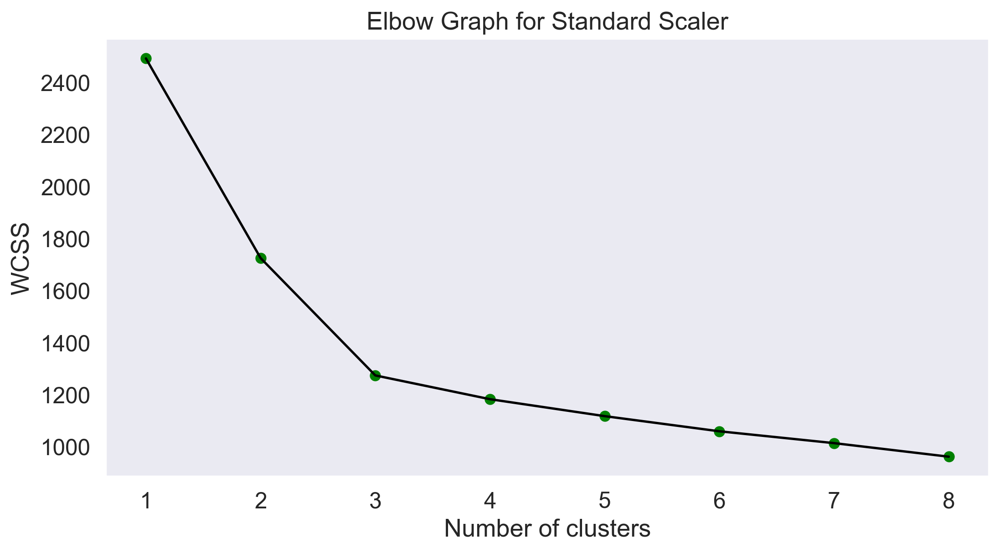

In [19]:
wcss=[]
for i in range(1,9):
    kmeans = KMeans(n_clusters=i,random_state=2)
    kmeans.fit(std_data)
    wcss.append(kmeans.inertia_)
    
# Plot K values range vs WCSS to get Elbow graph for choosing K (no. of clusters)
plt.plot(range(1,9),wcss,color = 'black')
plt.scatter(range(1,9),wcss,color='green')
plt.title('Elbow Graph for Standard Scaler')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [20]:
n_clusters = [2,3,4,5,6,7,8,9,10] # number of clusters
clusters_inertia = [] # inertia of clusters
sil_scores = [] # silhouette scores

for n in n_clusters:
    KM = KMeans(n_clusters=n, init='k-means++').fit(std_data)
    clusters_inertia.append(KM.inertia_)  # data for the elbow method
    silhouette_avg = silhouette_score(std_data, KM.labels_)
    sil_scores.append(silhouette_avg) # data for the silhouette score method

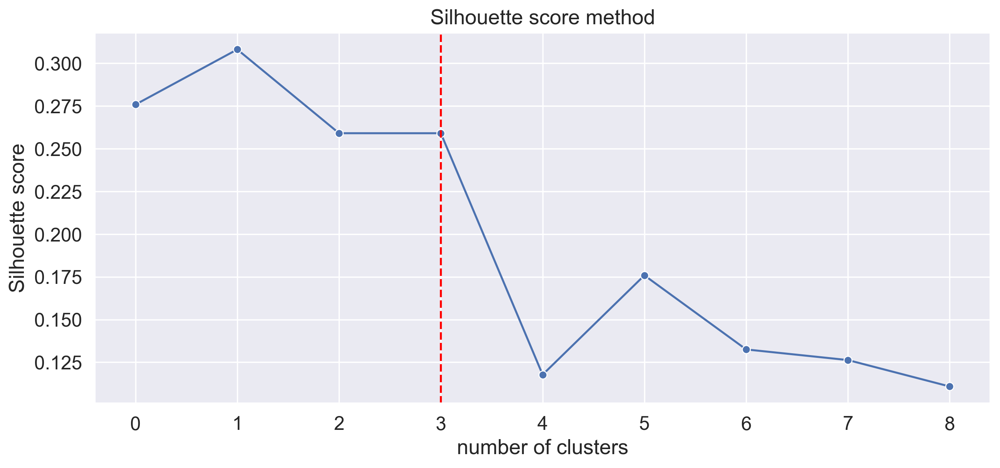

In [21]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(sil_scores,  marker='o', ax=ax)
ax.set_title("Silhouette score method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("Silhouette score")
ax.axvline(3, ls="--", c="red")
plt.grid()
plt.show()

In [22]:
clust_list = [2,3,4,5,6,7,8,9]

#  Silhouette score for stadardScaler applied on data.
for clusters in clust_list:
    cluster1 = KMeans(n_clusters=clusters, random_state=0)
    cluster_labels1 = cluster1.fit_predict(std_data)
    sil_score1= silhouette_score(std_data, cluster_labels1)
    print("For n_clusters =", clusters,"The average silhouette_score is :", sil_score1.round(2))

For n_clusters = 2 The average silhouette_score is : 0.29
For n_clusters = 3 The average silhouette_score is : 0.31
For n_clusters = 4 The average silhouette_score is : 0.26
For n_clusters = 5 The average silhouette_score is : 0.25
For n_clusters = 6 The average silhouette_score is : 0.17
For n_clusters = 7 The average silhouette_score is : 0.17
For n_clusters = 8 The average silhouette_score is : 0.14
For n_clusters = 9 The average silhouette_score is : 0.14


## KMeans o normalised data

In [23]:
cluster_range = range(1,15)
cluster_errors = []
for clusters in cluster_range:
    clusters = KMeans(clusters,n_init=10)
    clusters.fit(norm_data)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_errors.append(clusters.inertia_)
clusters_df = pd.DataFrame({"Num_Clusters":cluster_range,"Cluster_Errors":cluster_errors})
clusters_df

,Num_Clusters,Cluster_Errors
0,1,137.405486
1,2,87.198566
2,3,59.745079
3,4,54.817048
4,5,51.996245
5,6,49.241817
6,7,47.086392
7,8,44.957472
8,9,42.447844
9,10,41.190431


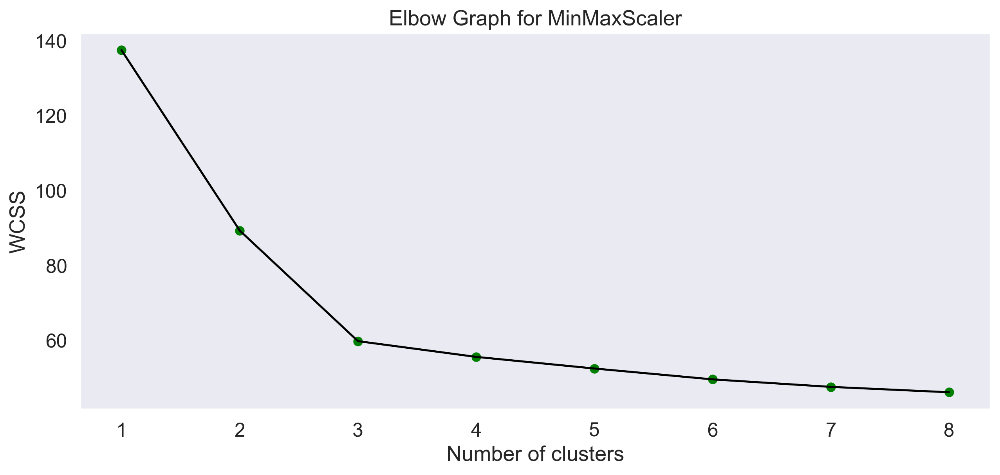

In [24]:
wcss=[]
for i in range (1,9):
    kmeans=KMeans(n_clusters=i,random_state=2)
    kmeans.fit(norm_data)
    wcss.append(kmeans.inertia_)
    
# Plot K values range vs WCSS to get Elbow graph for choosing K (no. of clusters)
fig, ax = plt.subplots(figsize=(12,5))
plt.plot(range(1,9), wcss,color = 'black')
plt.scatter(range(1,9), wcss,color='green')
plt.title('Elbow Graph for MinMaxScaler')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

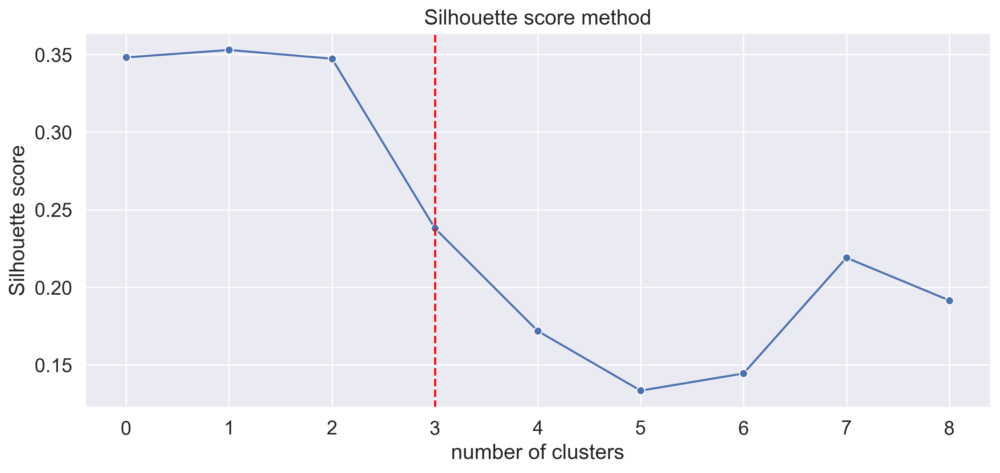

In [25]:
n_clusters = [2,3,4,5,6,7,8,9,10] # number of clusters
clusters_inertia = [] # inertia of clusters
sil_scores = [] # silhouette scores

for n in n_clusters:
    KM = KMeans(n_clusters=n, init='k-means++').fit(norm_data)
    clusters_inertia.append(KM.inertia_)    # data for the elbow method
    silhouette_avg = silhouette_score(norm_data, KM.labels_)
    sil_scores.append(silhouette_avg) # data for the silhouette score method

fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot( sil_scores, marker='o', ax=ax)
ax.set_title("Silhouette score method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("Silhouette score")
ax.axvline(3, ls="--", c="red")
plt.grid()
plt.show()

In [26]:
clust_list = [2,3,4,5,6,7,8,9]

# Silhouette score for MinMaxScaler Applied on data .
for clusters in clust_list:
    cluster1 = KMeans(n_clusters=clusters, random_state=0)
    cluster_labels1 = cluster1.fit_predict(norm_data)
    sil_score1= silhouette_score(norm_data, cluster_labels1)
    print("For n_clusters =", clusters,"The average silhouette_score is :", sil_score1.round(2))

For n_clusters = 2 The average silhouette_score is : 0.35
For n_clusters = 3 The average silhouette_score is : 0.35
For n_clusters = 4 The average silhouette_score is : 0.29
For n_clusters = 5 The average silhouette_score is : 0.23
For n_clusters = 6 The average silhouette_score is : 0.22
For n_clusters = 7 The average silhouette_score is : 0.22
For n_clusters = 8 The average silhouette_score is : 0.14
For n_clusters = 9 The average silhouette_score is : 0.13


### From the hyperparameter tuning of the parameters on both standardised data and normalised data the silhouette score obtain is same. Therefore creating a kmeans clustering without doing dimensioality reduction and with standardised data with three number of clusters and silhouette score 0.29.

In [27]:
kmeans_model = KMeans(n_clusters=3, random_state=42)
ypred_kmeans = kmeans_model.fit_predict(std_data)
ypred_kmeans.shape

(178,)

In [28]:
kmeans_model.cluster_centers_

array([[ 7.99603601e-02, -9.09328403e-01, -3.87959462e-01,
        -5.22831374e-01,  1.43257594e-01, -5.28184541e-01,
        -9.62003532e-02, -7.65223671e-04, -4.11471063e-03,
         4.65213833e-03, -8.94757968e-01,  4.32007195e-01,
         2.30777949e-01, -7.63273163e-01],
       [ 1.34745816e+00,  1.86543138e-01,  9.13998342e-01,
         2.58490017e-01,  5.98041866e-01, -3.45934688e-02,
        -9.88556997e-01, -1.23619475e+00,  7.16841717e-01,
        -7.60005714e-01,  9.90308072e-01, -1.19696611e+00,
        -1.30153966e+00, -3.80044610e-01],
       [-1.15133539e+00,  8.35232085e-01, -3.03107013e-01,
         3.60704697e-01, -6.27456616e-01,  5.98120068e-01,
         8.85237363e-01,  9.77819557e-01, -5.62089654e-01,
         5.95622366e-01,  1.84253038e-01,  4.79142857e-01,
         7.79247107e-01,  1.12518529e+00]])

In [29]:
df['KM_lables'] = ypred_kmeans
df.head()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,KM_lables
0,1.0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,2
1,1.0,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,2
2,1.0,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,2
3,1.0,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,2
4,1.0,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,2


In [30]:
df.groupby('KM_lables').agg('mean')

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
KM_lables,,,,,,,,,,,,,,
0,2.000000,12.264478,1.904813,2.229235,19.947761,92.417910,2.235075,2.028507,0.361343,1.588657,3.020896,1.054810,2.775075,507.208955
1,2.979592,13.151633,3.333163,2.434694,21.438776,99.020408,1.678163,0.797959,0.450816,1.163061,7.270816,0.685918,1.690204,627.551020
2,1.048387,13.676774,1.997903,2.461573,17.420968,107.483871,2.847581,3.003226,0.292097,1.917581,5.453548,1.065484,3.163387,1100.225806


### This is the clustering done on the dataset without applying PCA.
#### Now applying PCA and again creating Kmeans cluster to check the variation in the cluster formation.

#### PCA on standard data.

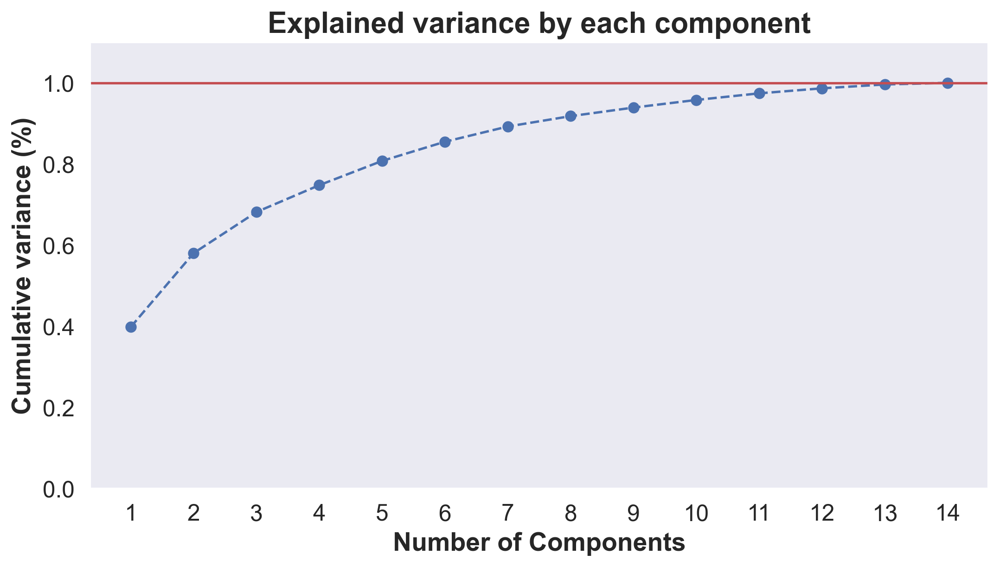

In [31]:
pca = PCA()
pca.fit(std_data)

# Plot
plt.figure(figsize=(10,5))
xi = np.arange(1, 1 + std_data.shape[1], step=1)
yi = np.cumsum(pca.explained_variance_ratio_)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

# Aesthetics
plt.ylim(0.0,1.1)
plt.xlabel('Number of Components',fontweight='bold', fontsize=16)
plt.xticks(np.arange(1, 1+std_data.shape[1], step=1))
plt.ylabel('Cumulative variance (%)',fontweight='bold', fontsize=16)
plt.title('Explained variance by each component',fontweight='bold',fontsize=18)
plt.axhline(y=1, color='r', linestyle='-')
plt.gca().xaxis.grid(False)

In [32]:
var = pca.explained_variance_ratio_
var

array([0.39807866, 0.18209648, 0.1013214 , 0.06619413, 0.05983257,
       0.04726317, 0.03753501, 0.02554538, 0.02108632, 0.01880492,
       0.01630103, 0.01233512, 0.00955758, 0.00404823])

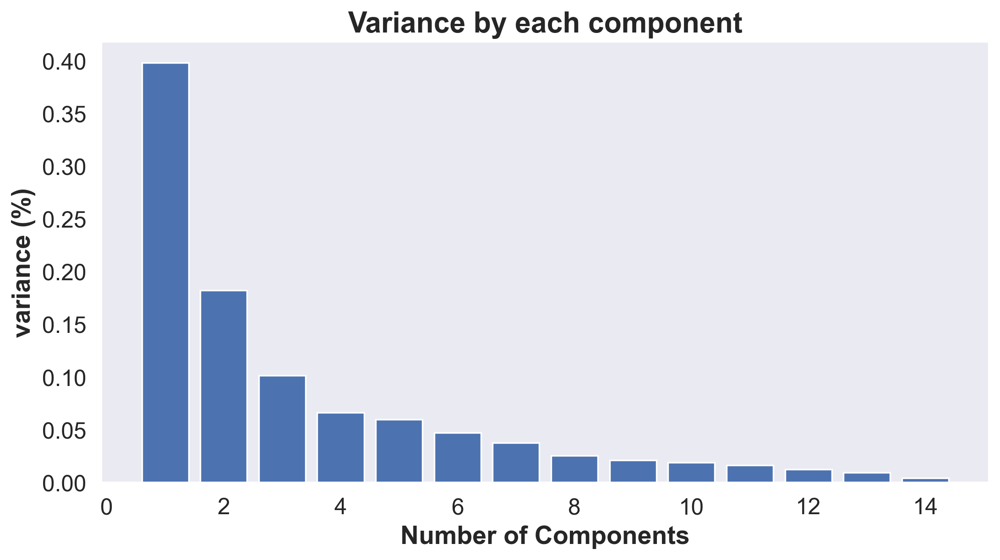

In [33]:
plt.bar(range(1, len(var) + 1), var)
plt.xlabel('Number of Components', fontweight='bold', fontsize=16)
plt.ylabel('variance (%)', fontweight='bold', fontsize=16)
plt.title('Variance by each component',fontweight='bold',fontsize=18)
plt.show()

In [34]:
pca = PCA(n_components=3)
pca_std = pca.fit_transform(std_data)

# Convert to data frame
pca_std_data = pd.DataFrame(data = pca_std, columns = ['PC1', 'PC2','PC3'])

# Shape and preview
print(pca_std_data.shape)
pca_std_data.head()

(178, 3)


,PC1,PC2,PC3
0,-3.561968,1.528967,-0.130558
1,-2.544330,-0.329993,-2.041603
2,-2.806546,1.042225,1.016791
3,-3.944287,2.793264,-0.154956
4,-1.415866,0.953430,2.117093


#### PCA components in 2D

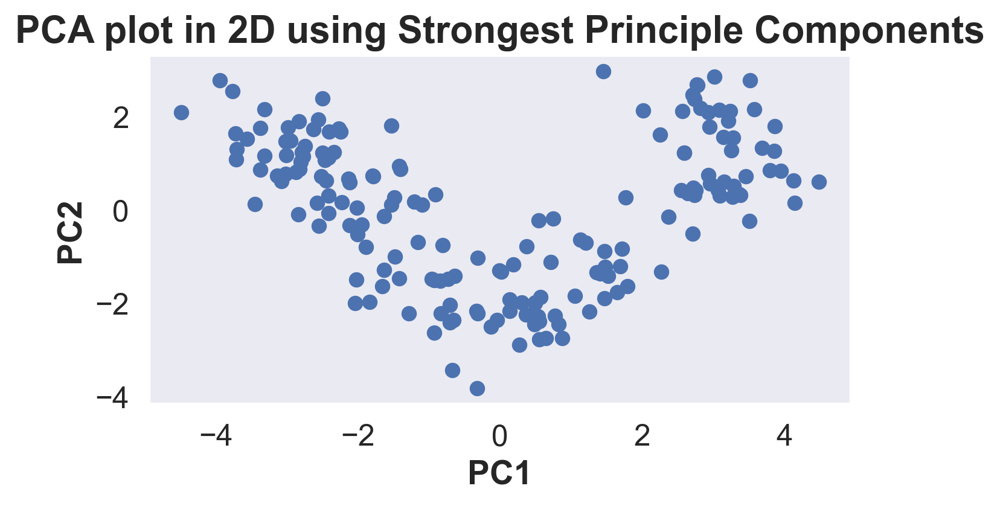

In [35]:
plt.figure(figsize=(6,3))

# Scatterplot
plt.scatter(pca_std_data.iloc[:,0], pca_std_data.iloc[:,1], s=40)
plt.title('PCA plot in 2D using Strongest Principle Components',fontweight='bold',fontsize=18)
plt.xlabel('PC1',fontweight='bold', fontsize=16)
plt.ylabel('PC2',fontweight='bold', fontsize=16)
plt.show()


#### PCA on normalised data.

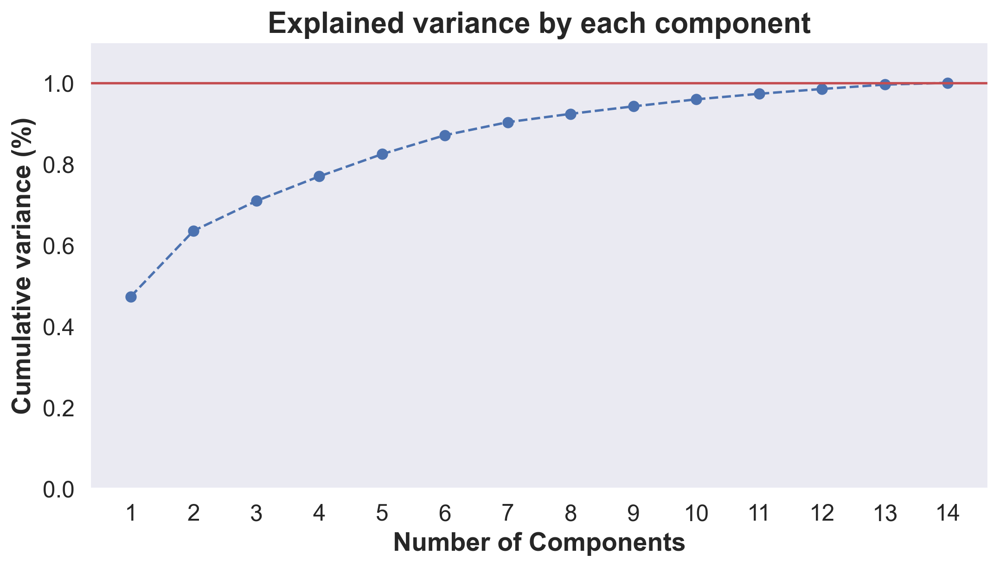

In [36]:
pca = PCA()
pca.fit(norm_data)

# Plot
plt.figure(figsize=(10,5))
xi = np.arange(1, 1 + norm_data.shape[1], step=1)
yi = np.cumsum(pca.explained_variance_ratio_)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

# Aesthetics
plt.ylim(0.0,1.1)
plt.xlabel('Number of Components',fontweight='bold', fontsize=16)
plt.xticks(np.arange(1, 1 + norm_data.shape[1], step=1))
plt.ylabel('Cumulative variance (%)',fontweight='bold', fontsize=16)
plt.title('Explained variance by each component',fontweight='bold',fontsize=18)
plt.axhline(y=1, color='r', linestyle='-')
plt.gca().xaxis.grid(False)

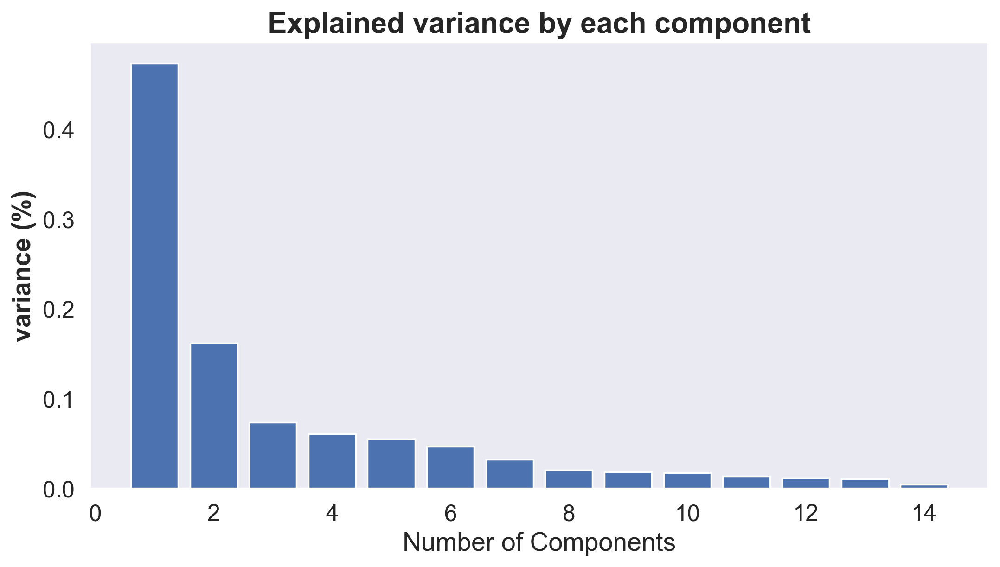

In [37]:
var = pca.explained_variance_ratio_
plt.bar(range(1, len(var)+1),var)
plt.xlabel('Number of Components',fontsize=16)
plt.ylabel('variance (%)',fontweight='bold', fontsize=16)
plt.title('Explained variance by each component',fontweight='bold',fontsize=18)
plt.show()

In [38]:
pca = PCA(n_components=3)
pca_norm = pca.fit_transform(norm_data)

# Convert to data frame
pca_norm_data = pd.DataFrame(data = pca_norm, columns = ['PC1', 'PC2','PC3'])

# Shape and preview
print(pca_norm_data.shape)
pca_norm_data.head()

(178, 3)


,PC1,PC2,PC3
0,-0.878928,0.319036,0.020236
1,-0.681397,-0.027733,-0.370165
2,-0.721225,0.235640,0.236216
3,-0.933694,0.638388,0.026089
4,-0.461426,0.143855,0.413084


#### PCA components in 2D

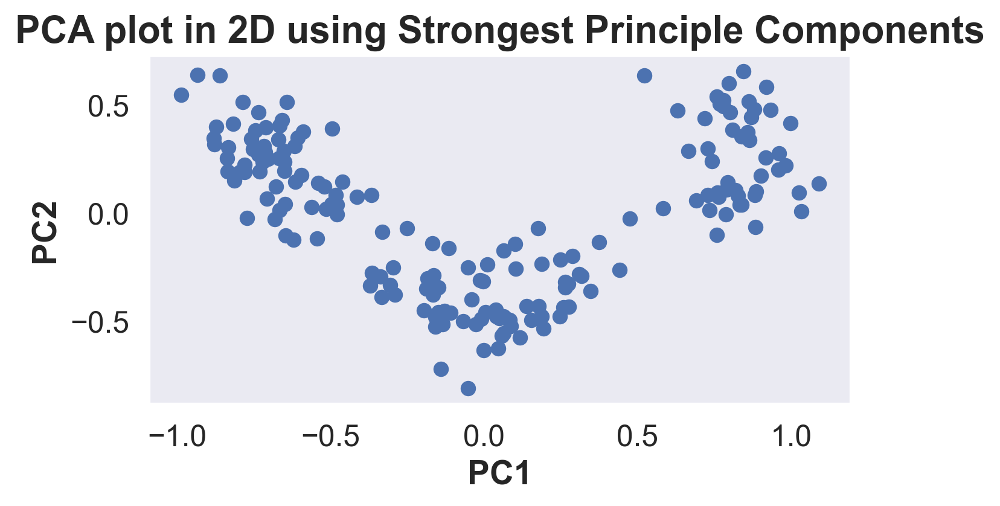

In [39]:
plt.figure(figsize=(6,3))
plt.scatter(pca_norm_data.iloc[:,0], pca_norm_data.iloc[:,1], s=40)

plt.title('PCA plot in 2D using Strongest Principle Components',fontweight='bold',fontsize=18)
plt.xlabel('PC1',fontweight='bold', fontsize=16)
plt.ylabel('PC2',fontweight='bold', fontsize=16)
plt.show()

### Elbow Method and Silhouette Score on PCA Normalised data.

In [40]:
cluster_range = range(1,15)
cluster_errors = []
for cluster in cluster_range:
    clusters = KMeans(cluster,n_init=10)
    clusters.fit(pca_std)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_errors.append(clusters.inertia_)
clusters_df = pd.DataFrame({"Num_Clusters":cluster_range,"Cluster_Errors":cluster_errors})
clusters_df

,Num_Clusters,Cluster_Errors
0,1,1698.289397
1,2,931.969410
2,3,489.538977
3,4,405.136652
4,5,352.860364
5,6,313.171720
6,7,277.754654
7,8,252.854977
8,9,230.286135
9,10,214.745086


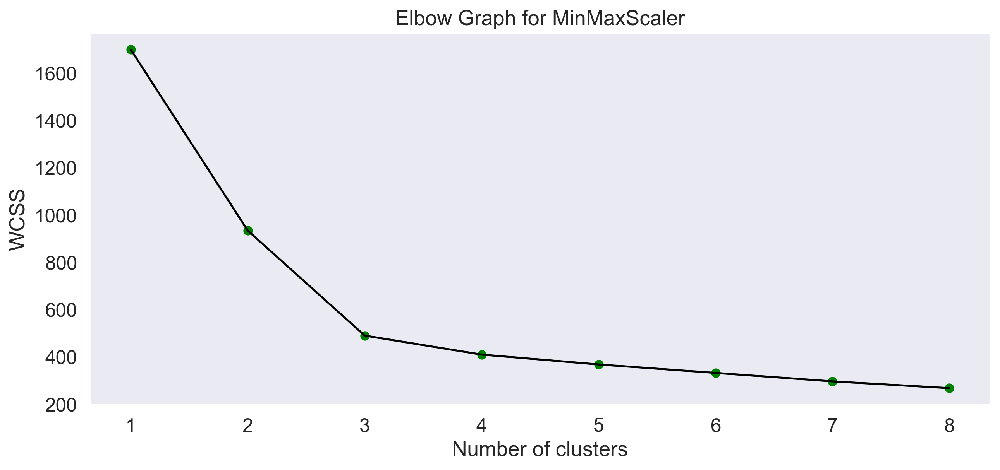

In [41]:
wcss=[]
for i in range (1,9):
    kmeans=KMeans(n_clusters=i,random_state=2)
    kmeans.fit(pca_std)
    wcss.append(kmeans.inertia_)
    
# Plot K values range vs WCSS to get Elbow graph for choosing K (no. of clusters)
fig, ax = plt.subplots(figsize=(12,5))
plt.plot(range(1,9), wcss,color = 'black')
plt.scatter(range(1,9), wcss,color='green')
plt.title('Elbow Graph for MinMaxScaler')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [42]:
clust_list = [2,3,4,5,6,7,8,9]

# Silhouette score for MinMaxScaler Applied on data .
for clusters in clust_list:
    cluster1 = KMeans(n_clusters=clusters, random_state=0)
    cluster_labels1 = cluster1.fit_predict(pca_std)
    sil_score1= silhouette_score(pca_std, cluster_labels1)
    print("For n_clusters =", clusters,"The average silhouette_score is :", sil_score1.round(2))

For n_clusters = 2 The average silhouette_score is : 0.42
For n_clusters = 3 The average silhouette_score is : 0.49
For n_clusters = 4 The average silhouette_score is : 0.43
For n_clusters = 5 The average silhouette_score is : 0.36
For n_clusters = 6 The average silhouette_score is : 0.31
For n_clusters = 7 The average silhouette_score is : 0.25
For n_clusters = 8 The average silhouette_score is : 0.32
For n_clusters = 9 The average silhouette_score is : 0.32


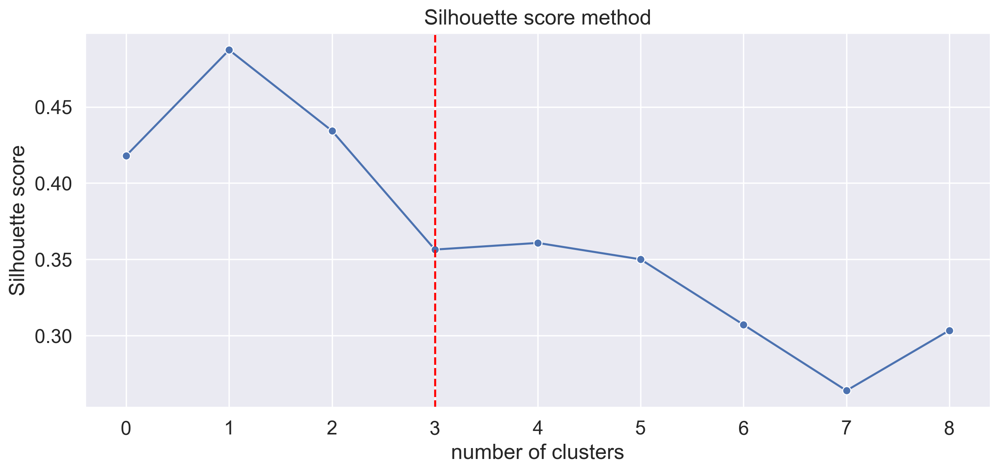

In [43]:
n_clusters = [2,3,4,5,6,7,8,9,10] # number of clusters
clusters_inertia = [] # inertia of clusters
sil_scores = [] # silhouette scores

for n in n_clusters:
    KM = KMeans(n_clusters=n, init='k-means++').fit(pca_std)
    clusters_inertia.append(KM.inertia_)    # data for the elbow method
    silhouette_avg = silhouette_score(pca_std, KM.labels_)
    sil_scores.append(silhouette_avg) # data for the silhouette score method

fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot( sil_scores, marker='o', ax=ax)
ax.set_title("Silhouette score method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("Silhouette score")
ax.axvline(3, ls="--", c="red")
plt.grid()
plt.show()

In [44]:
cluster_range = range(1,15)
cluster_errors = []
for cluster in cluster_range:
    clusters = KMeans(cluster,n_init=10)
    clusters.fit(pca_norm)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    cluster_errors.append(clusters.inertia_)
clusters_df = pd.DataFrame({"Num_Clusters":cluster_range,"Cluster_Errors":cluster_errors})
clusters_df

,Num_Clusters,Cluster_Errors
0,1,97.400258
1,2,47.274457
2,3,20.323634
3,4,16.850909
4,5,14.997261
5,6,13.150633
6,7,11.542924
7,8,10.598271
8,9,9.476184
9,10,8.799830


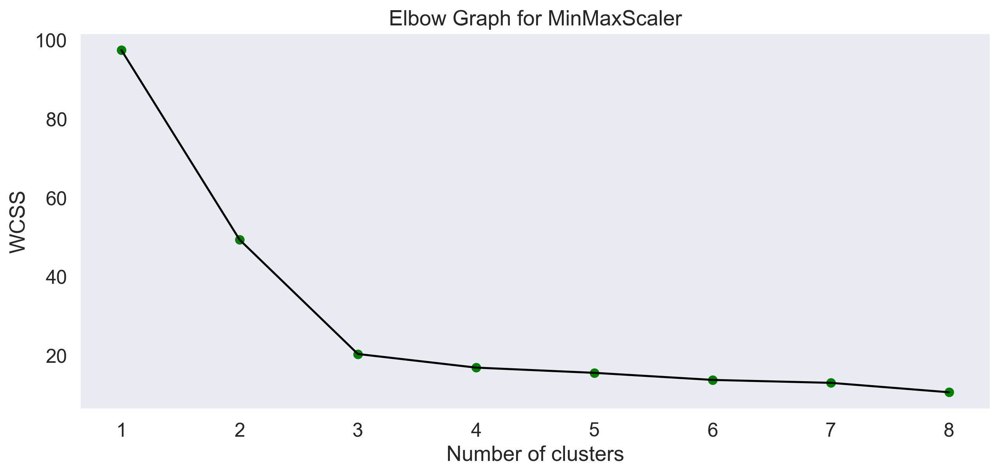

In [45]:
wcss=[]
for i in range (1,9):
    kmeans=KMeans(n_clusters=i,random_state=2)
    kmeans.fit(pca_norm)
    wcss.append(kmeans.inertia_)
    
# Plot K values range vs WCSS to get Elbow graph for choosing K (no. of clusters)
fig, ax = plt.subplots(figsize=(12,5))
plt.plot(range(1,9), wcss,color = 'black')
plt.scatter(range(1,9), wcss,color='green')
plt.title('Elbow Graph for MinMaxScaler')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [46]:
clust_list = [2,3,4,5,6,7,8,9]

# Silhouette score for MinMaxScaler Applied on data .
for clusters in clust_list:
    cluster1 = KMeans(n_clusters=clusters, random_state=0)
    cluster_labels1 = cluster1.fit_predict(pca_norm)
    sil_score1= silhouette_score(pca_norm, cluster_labels1)
    print("For n_clusters =", clusters,"The average silhouette_score is :", sil_score1.round(2))

For n_clusters = 2 The average silhouette_score is : 0.48
For n_clusters = 3 The average silhouette_score is : 0.56
For n_clusters = 4 The average silhouette_score is : 0.48
For n_clusters = 5 The average silhouette_score is : 0.4
For n_clusters = 6 The average silhouette_score is : 0.29
For n_clusters = 7 The average silhouette_score is : 0.32
For n_clusters = 8 The average silhouette_score is : 0.3
For n_clusters = 9 The average silhouette_score is : 0.31


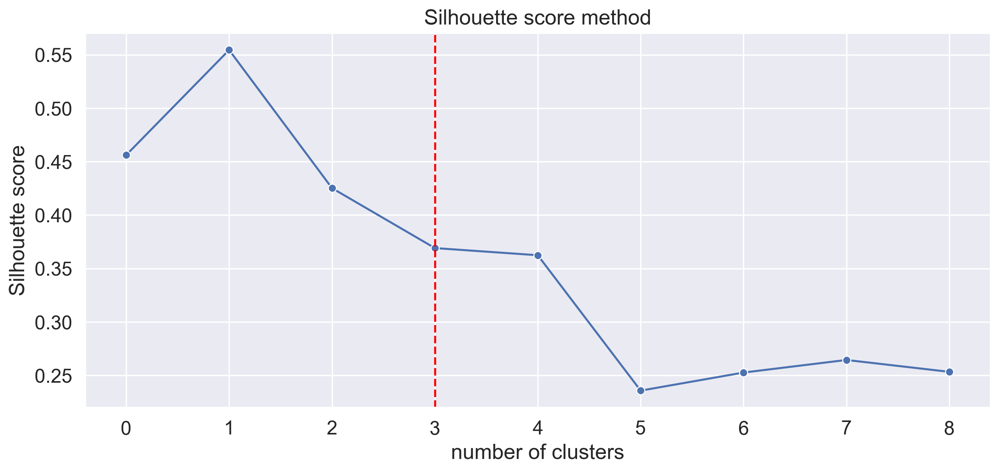

In [47]:
n_clusters = [2,3,4,5,6,7,8,9,10] # number of clusters
clusters_inertia = [] # inertia of clusters
sil_scores = [] # silhouette scores

for n in n_clusters:
    KM = KMeans(n_clusters=n, init='k-means++').fit(pca_std)
    clusters_inertia.append(KM.inertia_)    # data for the elbow method
    silhouette_avg = silhouette_score(pca_norm, KM.labels_)
    sil_scores.append(silhouette_avg) # data for the silhouette score method

fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot( sil_scores, marker='o', ax=ax)
ax.set_title("Silhouette score method")
ax.set_xlabel("number of clusters")
ax.set_ylabel("Silhouette score")
ax.axvline(3, ls="--", c="red")
plt.grid()
plt.show()

### From the hyperparameter tuning of the parameters on both standardised data and normalised data the silhouette score obtain is approximately same. But creating the cluster on normalised data with three cluster as it has silhouette score 0.46 which is maximum.

In [48]:
kmeans_model1 = KMeans(n_clusters=3, random_state=42)
ypred_kmeans1 = kmeans_model.fit_predict(pca_norm)
ypred_kmeans1.shape

(178,)

In [49]:
df['KM_lables1'] = ypred_kmeans1
df.head()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,KM_lables,KM_lables1
0,1.0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,2,2
1,1.0,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,2,2
2,1.0,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,2,2
3,1.0,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,2,2
4,1.0,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,2,2


In [50]:
df.groupby('KM_lables1').agg('mean')

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,KM_lables
KM_lables1,,,,,,,,,,,,,,,
0,2.000000,12.257246,1.901341,2.241123,20.050000,93.427536,2.252609,2.076232,0.362319,1.613188,3.057971,1.054525,2.786232,512.826087,0.057971
1,2.979592,13.151633,3.333163,2.434694,21.438776,99.020408,1.678163,0.797959,0.450816,1.163061,7.270816,0.685918,1.690204,627.551020,1.000000
2,1.016667,13.732167,2.005000,2.455646,17.219167,106.825000,2.847833,2.980833,0.288667,1.900333,5.492000,1.066167,3.163500,1113.533333,2.000000


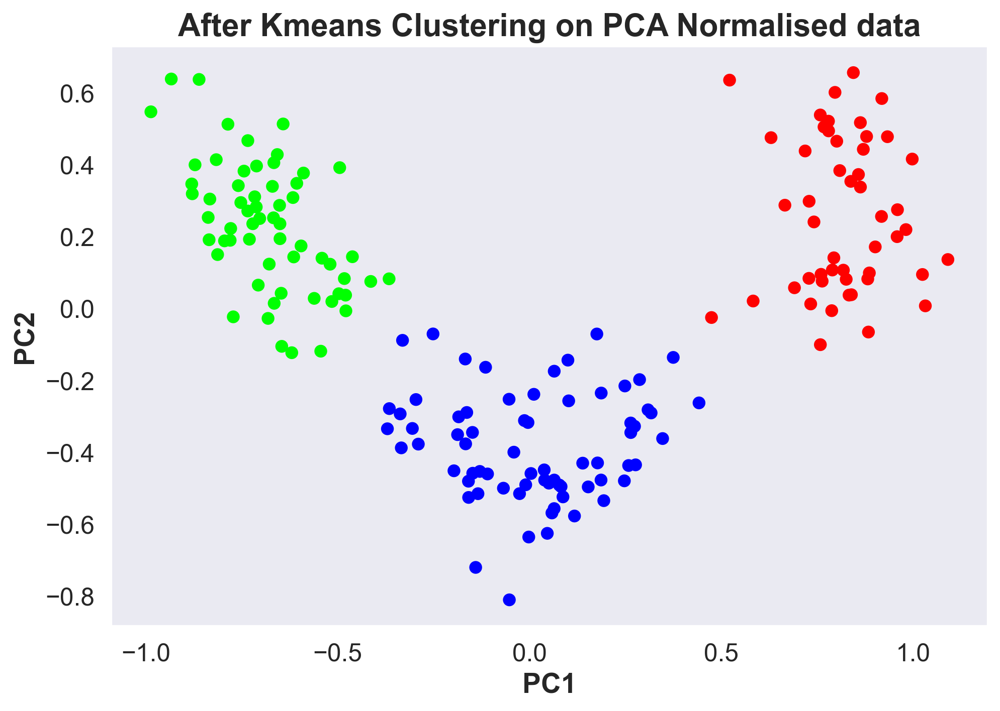

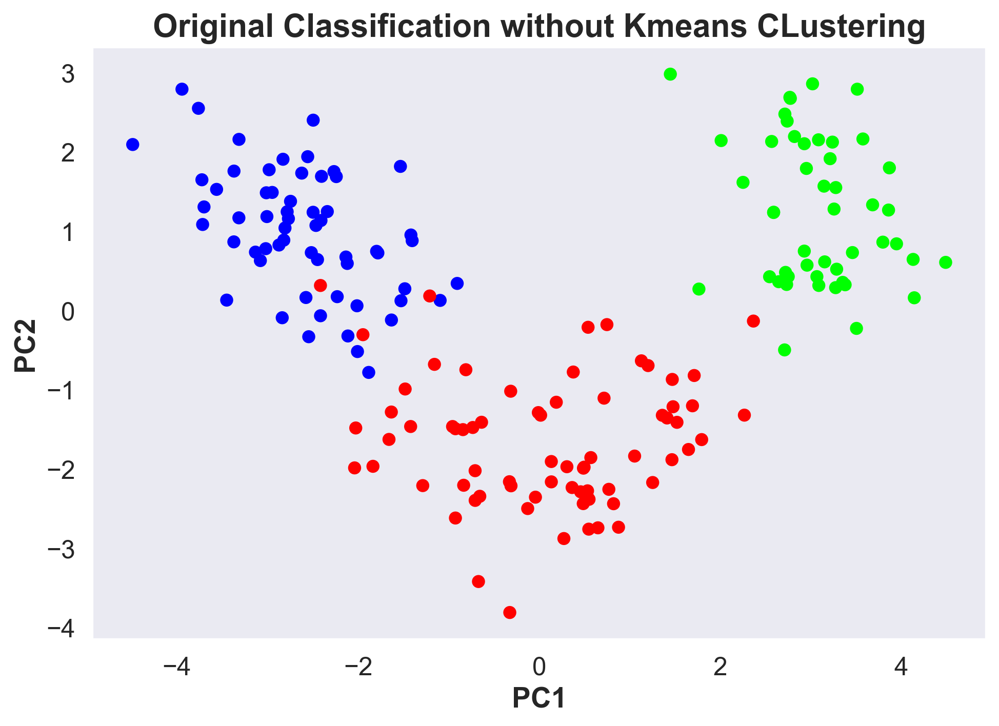

In [51]:
plt.figure(figsize=(9,6))
plt.scatter(pca_norm_data.iloc[:,0], pca_norm_data.iloc[:,1], c= df['KM_lables1'], cmap="brg", s=40)
plt.title('After Kmeans Clustering on PCA Normalised data',fontweight='bold', fontsize=18)
plt.xlabel('PC1', fontweight='bold', fontsize=16)
plt.ylabel('PC2', fontweight='bold', fontsize=16)
plt.show()

plt.figure(figsize=(9,6))
plt.scatter(pca_std_data.iloc[:,0], pca_std_data.iloc[:,1], c= df['Type'], cmap="brg", s=40)
plt.title('Original Classification without Kmeans CLustering',fontweight='bold', fontsize=18)
plt.xlabel('PC1', fontweight='bold', fontsize=16)
plt.ylabel('PC2', fontweight='bold', fontsize=16)
plt.show()


# Conclusion- From the scatter above plotted gives a clear idea of the clusters formed.
1. The kmeans clustering done without applying PCA also gives the optimal no. of clusters as three but in the scatter plot plotted it can be seen that clusters are not distinct, means distance between the clusters is less.
2. Whereas after applying PCA the cluster formed are distinct, the distance between the clusters is also sufficient.

### PCA
1. Applying PCA is recommended when the variables are many and we want to reduce the dimension of the dataset.
2. PCA helps in visualizing the data also. If dimension of the dataset is more we cannot visualize it but with the help of PCA we can rreduce the number of columns upto three which can be easily visualized.